In [1]:
import pandas as pd
import numpy as np
import warnings
import gc
import os
from pathlib import Path

import statsmodels.api as sm

import statsmodels.tsa.api as smt

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

DIR = Path('./data/')

# Dataloading

In [85]:
train = pd.read_csv(DIR / 'train.csv')
test = pd.read_csv(DIR / 'test.csv')
stores = pd.read_csv(DIR / 'stores.csv')
oil = pd.read_csv(DIR / 'oil.csv')
transactions =  pd.read_csv(DIR / 'transactions.csv').sort_values(["store_nbr", "date"])
holidays = pd.read_csv(DIR / 'holidays_events.csv')

# Datetime
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)
oil["date"] = pd.to_datetime(oil.date)
holidays["date"] = pd.to_datetime(holidays.date)

# Data types
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

# EDA

## Transactions

In [86]:
fig =px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )
fig.write_image("./figs/transactions_timeline_by_store.png") 

In [87]:
def get_color_palette(col):
    n = col.unique()
    pal = dict(zip(n, sns.color_palette("Set1", n_colors=len(n))))
    return pal 

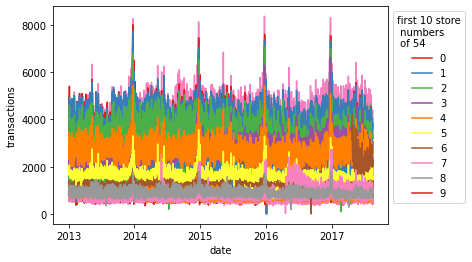

In [5]:
pal = get_color_palette(transactions['store_nbr'])
fig =sns.lineplot(data=transactions.sort_values(["store_nbr", "date"]), x="date", y="transactions", hue="store_nbr", palette=pal)
h,l = fig.get_legend_handles_labels()
fig.legend(h[0:10],[i for i in range(0,10)],title="first 10 store\n numbers\n of 54", loc="upper right") 
sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))
fig
plt.savefig("./figs/transactions_timeline_by_store.png",bbox_inches="tight")

In [6]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")


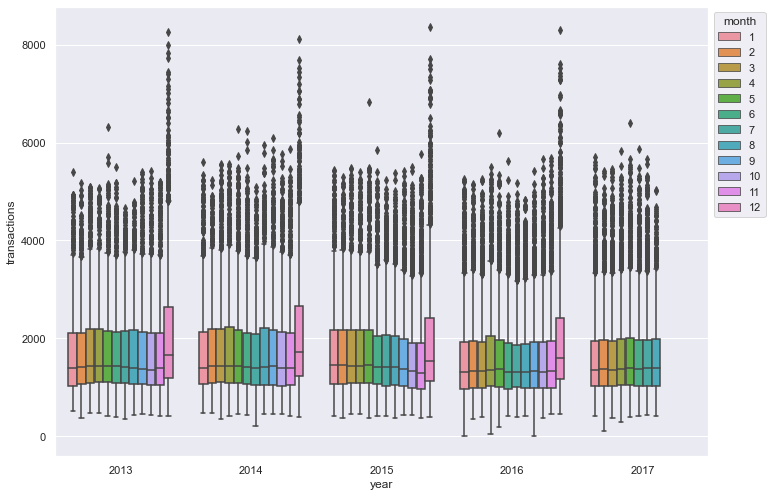

In [88]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
sns.set(rc={'figure.figsize':(11.7,8.27)})

ax = sns.boxplot(data=a, x="year", y="transactions" , hue = "month")
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# Saving the Seaborn Figure:
#plt.savefig('figs/transactions_boxplot.png')

There is a stable pattern in Transaction. All months are similar except December from 2013 to 2017 by boxplot. In addition, we've just seen same pattern for each store in previous plot. Store sales had always increased at the end of the year.

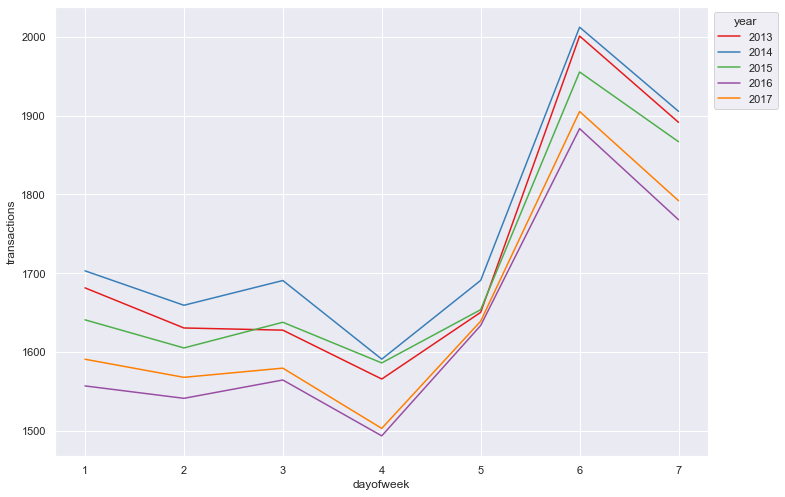

In [89]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
sns.set(rc={'figure.figsize':(11.7,8.27)})

a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
ax = sns.lineplot(data=a, x="dayofweek", y="transactions" , hue = "year", palette=get_color_palette(a["year"]))
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# Saving the Seaborn Figure:
#plt.savefig('figs/transactions_dayofweek.png')

In [9]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

## Oil

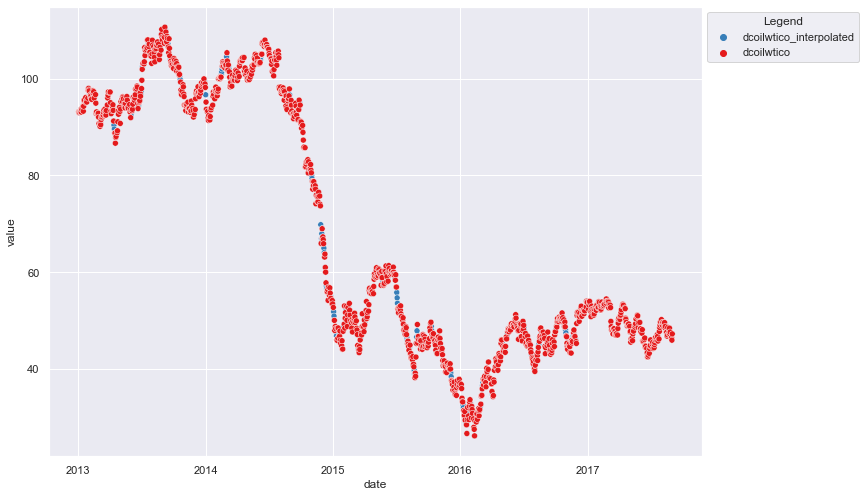

In [10]:
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
ax = sns.scatterplot(data = p.sort_values(["Legend", "date"], ascending = [False, True]), x="date", y="value", hue="Legend", palette=get_color_palette(p["Legend"] ))
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# Saving the Seaborn Figure:
plt.savefig('figs/oil_missing_data.png')

In [11]:
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

## Sales

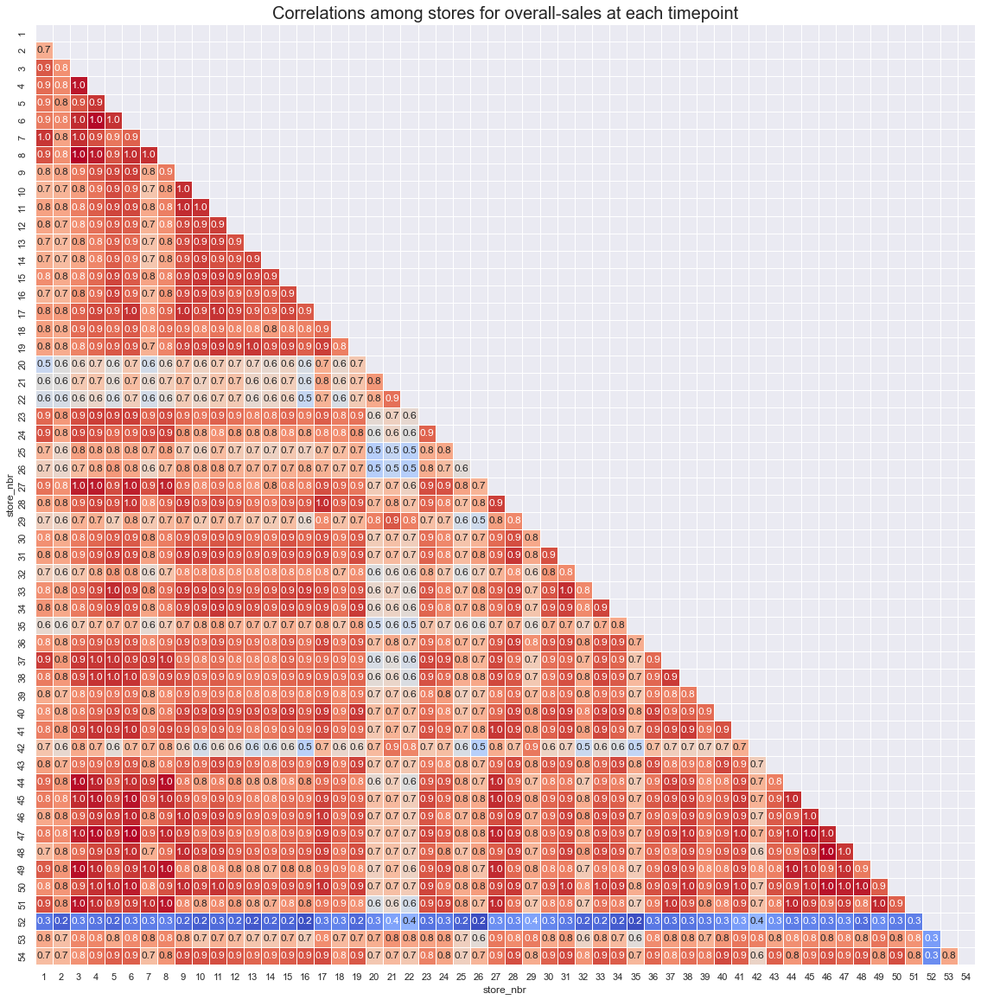

In [12]:
a = train[["store_nbr", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_nbr").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores for overall-sales at each timepoint",fontsize = 20)
plt.savefig('figs/correlations_among_stores.png')
plt.show()

Seasonal plots for sales over months

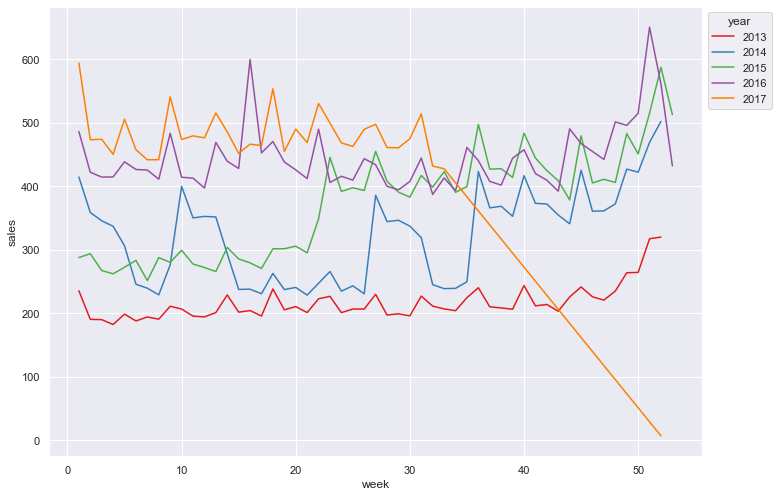

In [13]:
a = train
a["year"] = a.date.dt.year
a["week"] = a.date.dt.isocalendar().week
sns.set(rc={'figure.figsize':(11.7,8.27)})
a = a.groupby(["year", "week"]).sales.mean().reset_index()
ax = sns.lineplot(data=a, x="week", y="sales" , hue = "year", palette=get_color_palette(a["year"]))
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
# Saving the Seaborn Figure:
plt.savefig('figs/seasonal_plot_for_sales_over_week.png')

In [14]:
a = train.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "store_nbr", title = "Daily total sales of the stores")

In [15]:
a = train.set_index("date")

a = a.groupby(a.index).sales.sum().reset_index()
a.iloc[10:20,:]

,date,sales
10,2013-01-11,289737.69
11,2013-01-12,403258.22
12,2013-01-13,464638.56
13,2013-01-14,293348.38
14,2013-01-15,299129.56
15,2013-01-16,318347.91
16,2013-01-17,267498.53
17,2013-01-18,296130.84
18,2013-01-19,432459.84
19,2013-01-20,461092.38


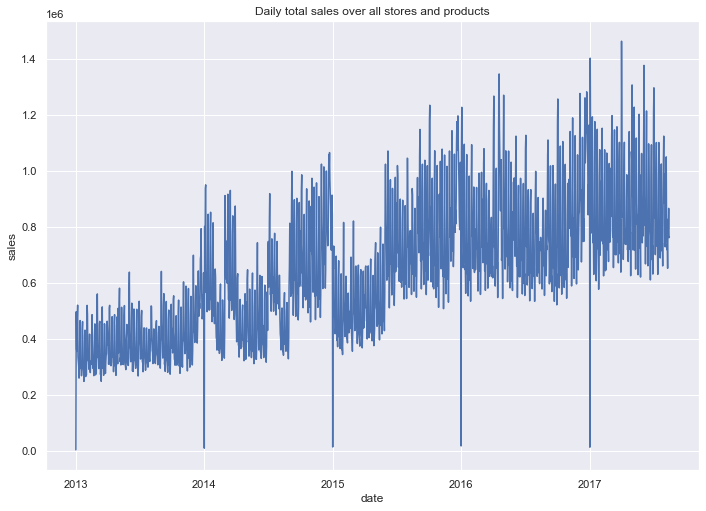

In [16]:
a = train.set_index("date")

a = a.groupby(a.index).sales.sum().reset_index()
fig =sns.lineplot(data=a, x = "date", y= "sales").set_title("Daily total sales over all stores and products")
#sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))
fig
plt.savefig("./figs/timeplot_overall_sales.png",bbox_inches="tight")

In [17]:
a[a["sales"] <= 100000]

,date,sales
0,2013-01-01,2511.62
364,2014-01-01,8602.07
728,2015-01-01,12773.62
1092,2016-01-01,16433.39
1457,2017-01-01,12082.50


scatter plots see is there correlation between two features

In [18]:
au = train[['sales', 'onpromotion','date']].groupby('date').mean()
au = au.reset_index()
au.iloc[10:20,:]

,date,sales,onpromotion
10,2013-01-11,162.59,0.00
11,2013-01-12,226.30,0.00
12,2013-01-13,260.74,0.00
13,2013-01-14,164.62,0.00
14,2013-01-15,167.86,0.00
15,2013-01-16,178.65,0.00
16,2013-01-17,150.11,0.00
17,2013-01-18,166.18,0.00
18,2013-01-19,242.68,0.00
19,2013-01-20,258.75,0.00


In [19]:
train_aux = train[['sales', 'onpromotion','date']].groupby('date').mean()
train_aux = train_aux.reset_index()

fig = px.scatter(train_aux[train_aux['onpromotion'] > 0], x="onpromotion", y="sales", color='sales', 
                           color_continuous_scale="earth",
                 size='sales', log_x=True, size_max=30)

fig.update_layout({"title": f'Correlation between OnPromotion and Sales (total avg sales)',
                   "xaxis": {"title":"On Promotion"},
                   "yaxis": {"title":"Sales"},
                   "showlegend": False})

fig.write_image("./figs/correlation_between_onpromotion_and_sales.png") 

Holiday data preparation

In [20]:
# holidays[holidays.type == "Holiday"]
# holidays[(holidays.type == "Holiday") & (holidays.transferred == True)]

# Transferred Holidays
tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
holidays = holidays.append(tr).reset_index(drop = True)


# Additional Holidays
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Bridge Holidays
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])

 
# Work Day Holidays, that is meant to payback the Bridge.
work_day = holidays[holidays.type == "Work Day"]  
holidays = holidays[holidays.type != "Work Day"]  


# Split

# Events are national
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()



d = pd.merge(train.append(test), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# National Holidays & Events
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regional
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Local
d = pd.merge(d, local, how = "left", on = ["date", "city"])

# Work Day: It will be removed when real work day colum created
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")

# EVENTS
events["events"] =np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)

# New features
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

# 
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["family", "city", "state", "type"]] = d[["family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()

d.head(10)

,id,date,store_nbr,family,sales,onpromotion,year,week,city,state,type,cluster,IsWorkDay,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,2013-01-01,1,BABY CARE,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,2013-01-01,1,BEAUTY,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,2013-01-01,1,BOOKS,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,6,2013-01-01,1,CELEBRATION,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,7,2013-01-01,1,CLEANING,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,8,2013-01-01,1,DAIRY,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,9,2013-01-01,1,DELI,0.00,0.00,2013.00,1,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


autocorrelation

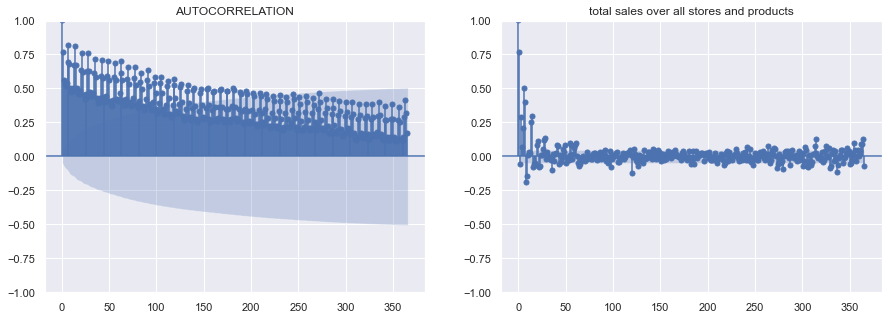

In [21]:
a = d[(d.sales.notnull())].groupby(["date"]).sales.mean().reset_index().set_index("date")
fig, ax = plt.subplots(1,2,figsize=(15,5))
sm.graphics.tsa.plot_acf(a.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION" )
sm.graphics.tsa.plot_pacf(a.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION")

#fig.savefig('test.jpg')
plt.title("total sales over all stores and products")
plt.savefig("./figs/ACF_PACF.png",bbox_inches="tight")


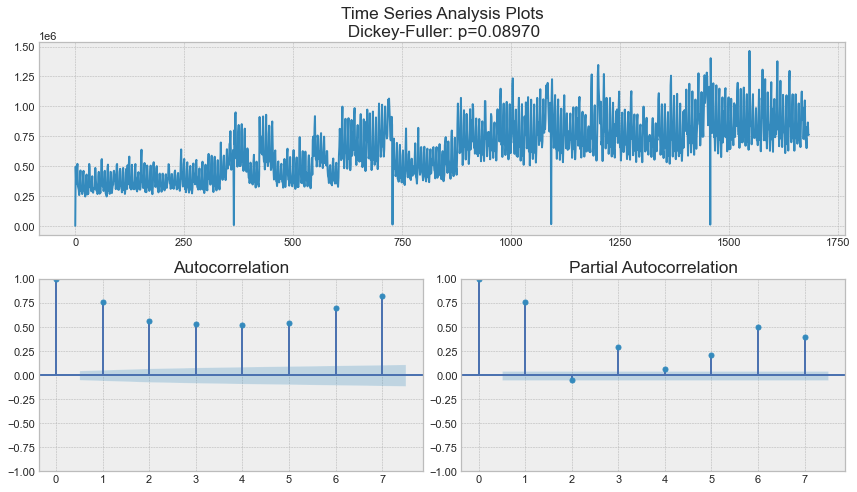

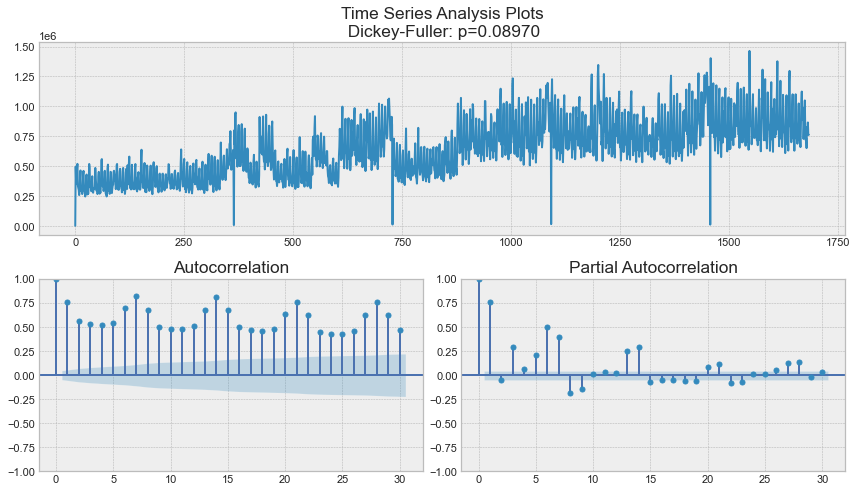

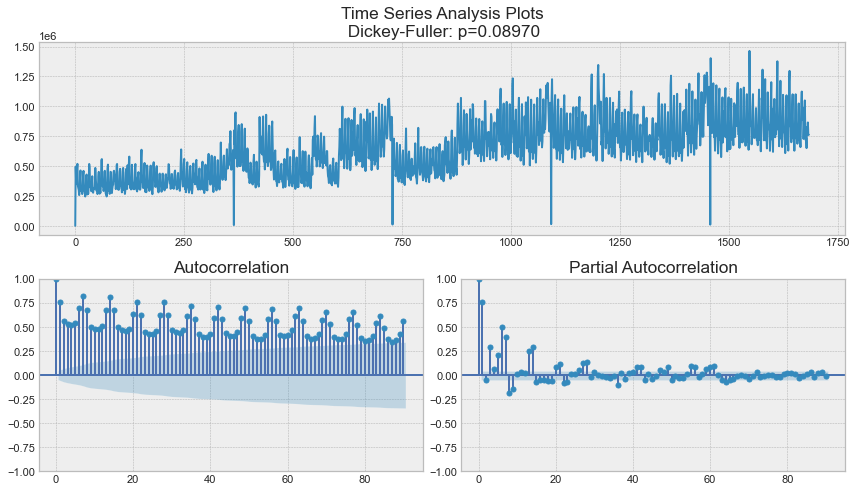

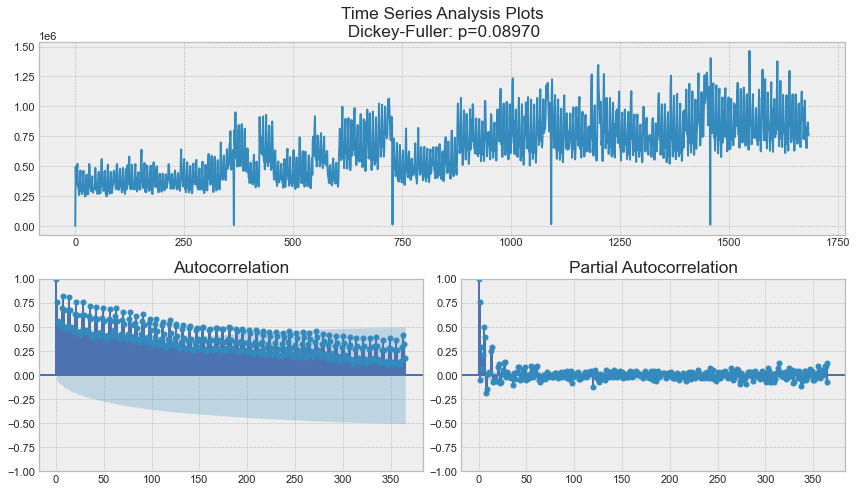

In [23]:
train_date = train.groupby('date')['sales'].sum().reset_index()

def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
   

for i in [7, 30, 90, 365]:
    tsplot(train_date.sales, lags=i)
    plt.savefig("./figs/tsplot_"+str(i)+".png",bbox_inches="tight")
    plt.show()

STL decomposition

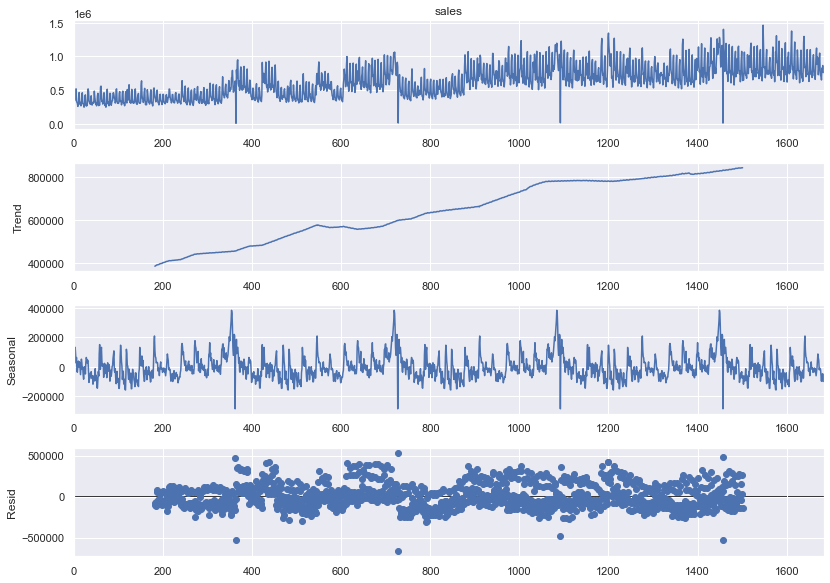

In [25]:
# Perform a STL decomposition on train_date['sales'] with a frequency of 7
sm.tsa.seasonal_decompose(train_date['sales'], period = 365).plot()
plt.savefig("./figs/stl_decomposition.png",bbox_inches="tight")

## Load the preprocessed training and validation data

In [2]:
train = pd.read_csv(DIR / 'preprocessed'/ 'train_preprocessed.csv')
validation = pd.read_csv(DIR / 'preprocessed'/ 'validation_preprocessed.csv')

train["date"] = pd.to_datetime(train.date)
validation["date"] = pd.to_datetime(validation.date)

train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")

validation.onpromotion = validation.onpromotion.astype("float16")
validation.sales = validation.sales.astype("float32")

In [3]:
train = train.drop(['onpromotion'], axis=1)
validation = validation.drop(['onpromotion'], axis=1)

In [4]:
validation.set_index('date', inplace=True)
train.set_index('date', inplace=True)

Exponential Smoothing

In [9]:
def exponential_smoothing(series, alpha):

    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

In [10]:
def plot_exponential_smoothing(series, alphas):
    plt.figure(figsize=(17, 8))

    plt.plot(series.values, "c", label = "Actual")
    for alpha in alphas:
        plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Exponential Smoothing")
    plt.grid(True)
    plt.savefig("./figs/exponential_smoothing.png",bbox_inches="tight");

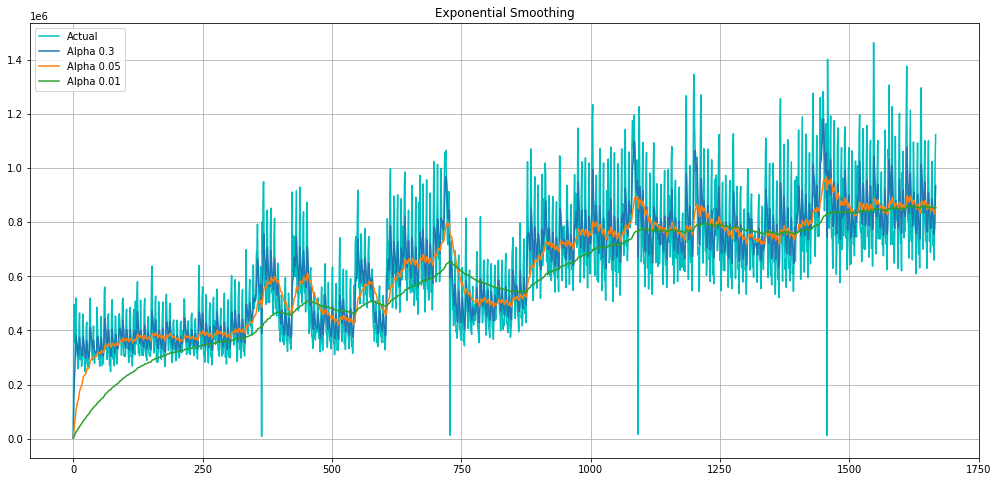

In [12]:
plot_exponential_smoothing(train['sales'], [0.3,0.05,0.01])

In [6]:
validation

,sales
date,
2017-07-31,885856.81
2017-08-01,988527.75
2017-08-02,964712.00
2017-08-03,728068.50
2017-08-04,827775.69
2017-08-05,965693.62
2017-08-06,1049559.12
2017-08-07,797464.94
2017-08-08,717766.38


In [7]:
import numpy as np
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

# Fit the simple exponential smoothing model to the training 

alphas = [1,0.3,0.15,0.01,'auto']
for alpha in alphas:
    if alpha == 'auto':
        model = SimpleExpSmoothing(train, initialization_method="heuristic").fit(optimized=True)
    else:
        model = SimpleExpSmoothing(train, initialization_method="heuristic").fit(smoothing_level=alpha, )
    # Use the model to predict the values for the validation data
    #validation['fitted_values']  = model.fittedvalues
    predictions = model.predict(start=len(train), end=len(train) + len(validation) - 1)
    validation['predictions_'+str(alpha)]  = predictions.values


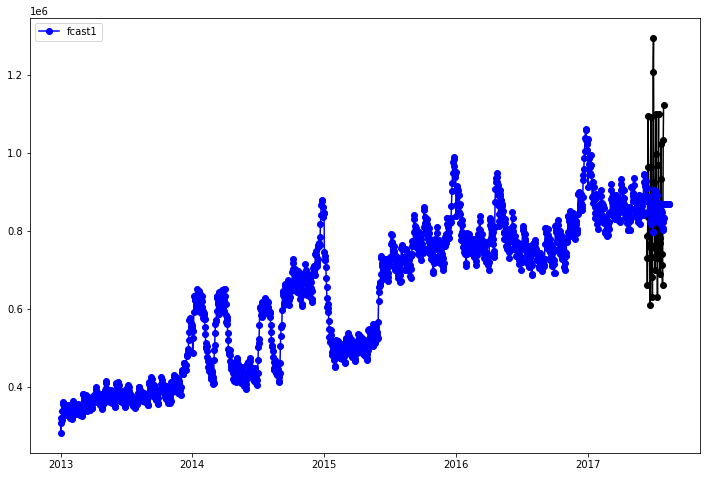

In [8]:
plt.figure(figsize=(12, 8))
plt.plot(train.tail(16*3), marker="o", color="black")
plt.plot(model.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(validation['predictions_auto'], marker="o", color="blue")
#plt.plot(fit2.fittedvalues, marker="o", color="red")
#(line2,) = plt.plot(fcast2, marker="o", color="red")
#plt.plot(fit3.fittedvalues, marker="o", color="green")
#(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1], ["fcast1"] )

<AxesSubplot:xlabel='date'>

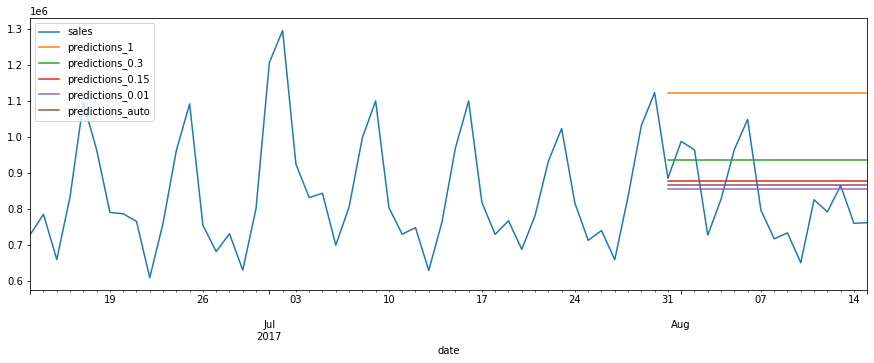

In [9]:
data_all = pd.concat([train.tail(16*3), validation], sort=False)
_ = data_all[ ['sales'] +['predictions_'+str(alpha) for alpha in alphas ]].plot(figsize=(15, 5))
_

In [93]:

import numpy as np
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

# Fit the simple exponential smoothing model to the training 
alphas = [1,0.3,0.01,'optimized']
result = []
for alpha in alphas:
    if alpha == 'optimized':
        model = SimpleExpSmoothing(train, initialization_method="heuristic").fit(optimized=True)
    else:
        model = SimpleExpSmoothing(train, initialization_method="heuristic").fit(smoothing_level=alpha,optimized=False)
    # Use the model to predict the values for the validation data
    #validation['fitted_values']  = model.fittedvalues
    predictions = model.predict(start=len(train), end=len(train) + len(validation) - 1).rename('α= '+str(alpha))
    validation['prediction_'+str(alpha)]  = predictions.values
    result.append([model.fittedvalues,validation['prediction_'+str(alpha)],predictions.name])



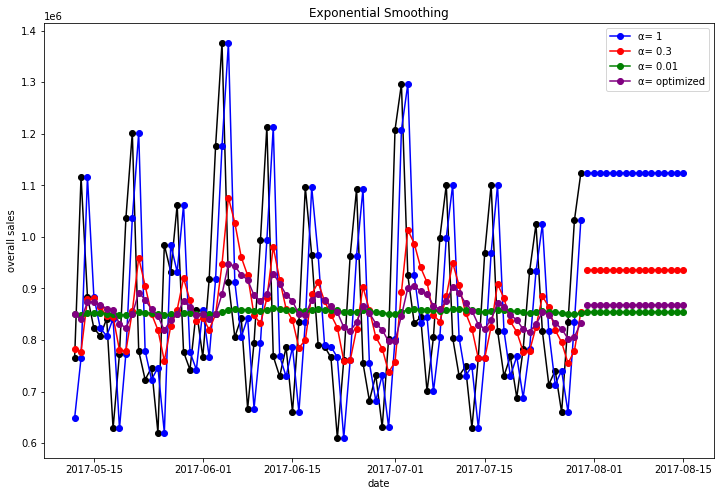

In [74]:
plt.figure(figsize=(12, 8))
plt.plot(train.tail(16*5), marker="o", color="black")

colors = ['blue','red','green','purple']
lines = []
names = []
for i,r in enumerate( result):
    plt.plot(r[0].tail(16*5), marker="o", color=colors[i])
    (line,) = plt.plot(r[1], marker="o", color=colors[i])
    lines.append(line)
    names.append(r[2])
plt.legend(lines , names)
plt.ylabel("overall sales")
plt.xlabel("date")
plt.title("Exponential Smoothing")
plt.savefig("./figs/SimpleExpSmoothing.png",bbox_inches="tight")

In [5]:
from sklearn.metrics import mean_squared_error, mean_absolute_error ,mean_squared_log_error

# Get the Root Mean Squared Logarithmic Error (RMSLE)
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_log_error(y, y_pred))

In [53]:
validation.tail()

,sales,prediction_1,prediction_0.3,prediction_0.01,prediction_auto
date,,,,,
2017-08-11,826373.75,1123752.50,935590.50,855098.60,868256.29
2017-08-12,792630.56,1123752.50,935590.50,855098.60,868256.29
2017-08-13,865639.69,1123752.50,935590.50,855098.60,868256.29
2017-08-14,760922.38,1123752.50,935590.50,855098.60,868256.29
2017-08-15,762661.94,1123752.50,935590.50,855098.60,868256.29


In [95]:
print(mean_squared_error(validation['sales'],validation['prediction_optimized']))
print(mean_absolute_error(validation['sales'],validation['prediction_optimized']))
print(rmsle(validation['sales'],validation['prediction_optimized']))
  

13160246510.827034
99941.03830139423
0.13876294591305696


### Double exponential smoothing 

In [96]:

import numpy as np
from statsmodels.tsa.holtwinters import Holt

# Fit the simple exponential smoothing model to the training 
alphas = [1,0.3,0.1,'optimized']
betas  = [1,0.3,0.1,'optimized']
result = []
for i,alpha in enumerate(alphas):
    if alpha == 'optimized':
        model = Holt(train, initialization_method="heuristic").fit(optimized=True)
    else:
        model = Holt(train, initialization_method="heuristic").fit(smoothing_level=alpha,smoothing_slope = betas[i],optimized=False)
    # Use the model to predict the values for the validation data
    #validation['fitted_values']  = model.fittedvalues
    predictions = model.predict(start=len(train), end=len(train) + len(validation) - 1).rename('α&β= '+str(alpha))
    validation['prediction_holt_'+str(alpha)]  = predictions.values
    result.append([model.fittedvalues,validation['prediction_holt_'+str(alpha)],predictions.name])


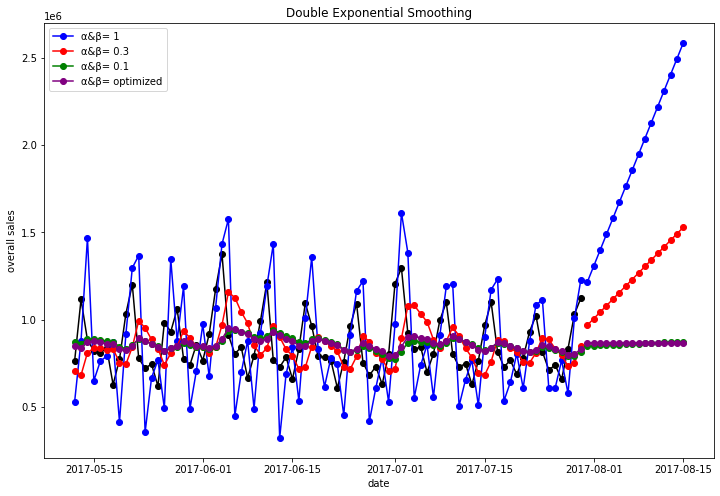

In [82]:
plt.figure(figsize=(12, 8))
plt.plot(train.tail(16*5), marker="o", color="black")

colors = ['blue','red','green','purple']
lines = []
names = []
for i,r in enumerate( result):
    plt.plot(r[0].tail(16*5), marker="o", color=colors[i])
    (line,) = plt.plot(r[1], marker="o", color=colors[i])
    lines.append(line)
    names.append(r[2])
plt.legend(lines , names)
plt.ylabel("overall sales")
plt.xlabel("date")
plt.title("Double Exponential Smoothing")
plt.savefig("./figs/Holt.png",bbox_inches="tight")

In [57]:
validation.tail()

,sales,prediction_1,prediction_0.3,prediction_0.01,prediction_auto,prediction_holt_1,prediction_holt_0.3,prediction_holt_0.1,prediction_holt_auto
date,,,,,,,,,
2017-08-11,826373.75,1123752.50,935590.50,855098.60,868256.29,2221052.00,1380340.56,868462.91,869443.79
2017-08-12,792630.56,1123752.50,935590.50,855098.60,868256.29,2312493.62,1417758.76,870163.79,869575.82
2017-08-13,865639.69,1123752.50,935590.50,855098.60,868256.29,2403935.25,1455176.97,871864.67,869707.84
2017-08-14,760922.38,1123752.50,935590.50,855098.60,868256.29,2495376.88,1492595.17,873565.55,869839.87
2017-08-15,762661.94,1123752.50,935590.50,855098.60,868256.29,2586818.50,1530013.38,875266.42,869971.89


In [97]:
print(mean_squared_error(validation['sales'],validation['prediction_holt_optimized']))
print(mean_absolute_error(validation['sales'],validation['prediction_holt_optimized']))
print(rmsle(validation['sales'],validation['prediction_holt_optimized']))



13278469560.528961
100600.89259762573
0.1393858049730297


In [ ]:
def double_exponential_smoothing(series, alpha, beta):

    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
        trend = beta * (level - last_level) + (1 - beta) * trend
        result.append(level + trend)
    return result

In [ ]:
def plot_double_exponential_smoothing(series, alphas, betas):
     
    plt.figure(figsize=(17, 8))
    plt.plot(series.values, label = "Actual")
    for alpha in alphas:
        for beta in betas:
            plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
    
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Double Exponential Smoothing")
    plt.grid(True)
    plt.savefig("./figs/double_exponential_smoothing.png",bbox_inches="tight");

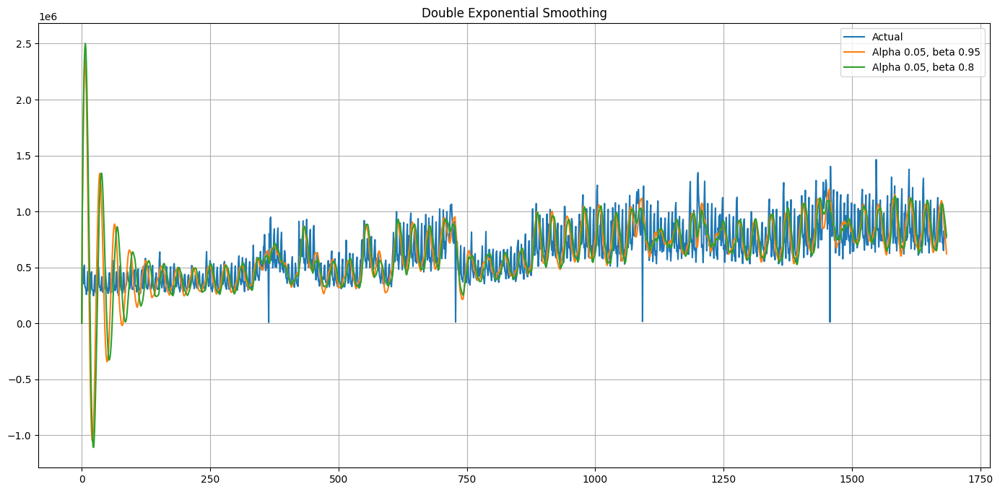

In [ ]:
plot_double_exponential_smoothing(train_date['sales'], alphas=[0.05], betas=[0.95,0.8])

In [6]:
# Get a SARIMA model for res 
mod = sm.tsa.statespace.SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
res = mod.fit()
print(res.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             sales   No. Observations:                 1668
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood              -21577.038
Date:                           Sat, 21 Jan 2023   AIC                          43164.076
Time:                                   12:15:22   BIC                          43191.149
Sample:                                        0   HQIC                         43174.110
                                          - 1668                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4002      0.025     16.221      0.000       0.352       0.449
ma.L1         -0.8985      0.022    -41.438

In [60]:
predict = res.get_prediction()
predict_ci = predict.conf_int()


predictions = res.predict(start=len(train), end=len(train) + len(validation) - 1, dynamic=False)

In [61]:
validation['prediction_sarima']  = predictions.values

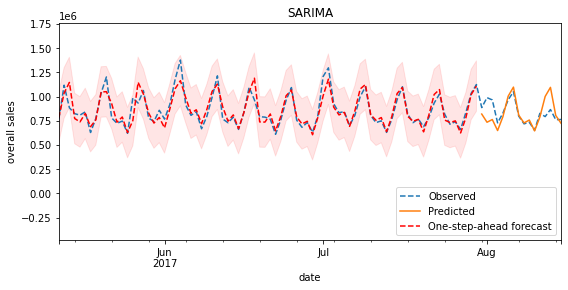

In [67]:
fig, ax = plt.subplots(figsize=(9,4))
npre = 4
ax.set(title='SARIMA', xlabel='date', ylabel='overall sales')

# Plot data points
pd.concat([train['sales'].tail(16*5) ,validation['sales']]).plot(ax=ax, style='--', label='Observed')


validation['prediction_sarima'].plot(ax=ax, style='-', label='Predicted')


# Plot predictions
predict.predicted_mean.tail(16*5).plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci
ax.fill_between(ci.index, ci.iloc[:,0], ci.iloc[:,1], color='r', alpha=0.1)
#predict_dy.predicted_mean.loc['1977-07-01':].plot(ax=ax, style='g', label='Dynamic forecast (1978)')
#ci = predict_dy_ci.loc['1977-07-01':]
#ax.fill_between(ci.index, ci.iloc[:,0], ci.iloc[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')
plt.savefig("./figs/sarima.png",bbox_inches="tight")

In [69]:
print(mean_squared_error(validation['sales'],validation['prediction_sarima']))
print(mean_absolute_error(validation['sales'],validation['prediction_sarima']))
print(rmsle(validation['sales'],validation['prediction_sarima']))

13911885697.10055
83125.14849173954
0.134025810826792


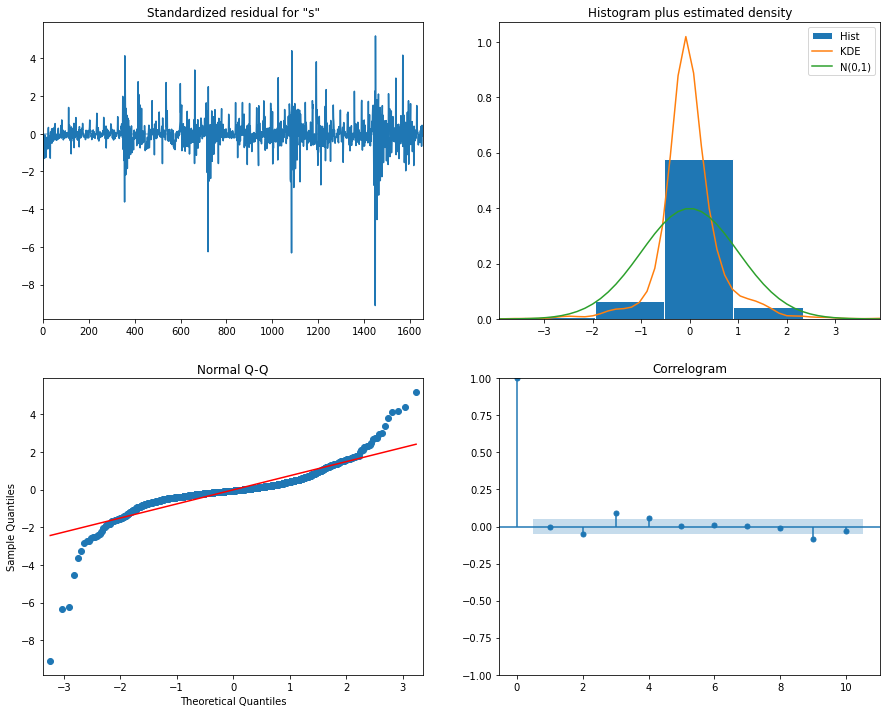

In [66]:
# Plot res
res.plot_diagnostics(figsize=(15,12))
plt.savefig("./figs/sarima_model.png",bbox_inches="tight")